# Analisis Semantik Fasttext + W2V (Fast 2 Vec)

In [1]:
# import Library
import os
import time
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')
from jcopml.utils import save_model, load_model
from string import punctuation

from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec, FastText
import gensim
from string import punctuation
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

from src.topic_semantic import TopicSemanticEvolvingDynamic, rename_columns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px


# Load Data

In [2]:
df_cluster_ft_w2v = pd.read_csv('data/x_hasil_cluster_fasttext_w2v_menggunakan_stopwords.csv')
df_centroid_ft_w2v = pd.read_csv('data/centroid_fasttext_w2v_menggunakan_stopwords.csv')
df_topic_prob = pd.read_excel('data/topic_prob.xlsx', engine='openpyxl')
df_topic_word = pd.read_excel('data/topic_word.xlsx', engine='openpyxl')
df_intensity = pd.read_excel('data/intensity_by_year.xlsx', engine='openpyxl')
df_top_words = pd.read_excel('data/top_words_each_topic.xlsx', engine='openpyxl')

df_topic_word.rename({'Unnamed: 0':'topic'}, axis=1, inplace=True)
df_topic_prob.rename({'Unnamed: 0':'topic'}, axis=1, inplace=True)

In [3]:
df_topic_word.head(20)

topic  year            1            2              3            4  \
0       1  2023       system  application        network   technology   
1       2  2023       system        power         energy      control   
2       3  2023   corruption    indonesia           area    community   
3       4  2023        group      patient          child      disease   
4       5  2023        model    algorithm       accuracy        image   
5       6  2023      student    education       analysis       medium   
6       7  2023         work      company         social        local   
7       8  2023         body         leaf          color        value   
8       1  2022        model    algorithm        network     accuracy   
9       2  2022  qualitative     language       approach    education   
10      3  2022       system        power         energy      control   
11      4  2022         area      village       activity        plant   
12      5  2022      student     analysis         effect      teacher   
13      6  2022        group      patient      treatment        level   
14      7  2022       system  information    application      service   
15      8  2022        water      content    temperature        value   
16      1  2021       effect     variable       analysis  significant   
17      2  2021      article  application  communication     approach   
18      3  2021       system        power      algorithm  performance   
19      4  2021      service    community    development   management   

                5            6            7              8               9  \
0     information         user      service          model        security   
1         voltage      current   controller     simulation          design   
2           water   government      village            out         balance   
3          health        level    treatment          plant          factor   
4         network  performance    technique        feature         machine   
5          effect       school         test        teacher        obtained   
6         hearing      product  development        process         tourism   
7        activity       specie       weight  concentration    respectively   
8           image  performance    technique        feature  classification   
9          social      islamic   government            law         article   
10     simulation  performance      voltage           load      controller   
11          value      regency       farmer           land       community   
12         school         test        model          value     significant   
13        disease      control      tourism         weight          design   
14        process   technology    indonesia        problem             out   
15  concentration        waste          oil           test        material   
16    performance      company        value      influence         islamic   
17            law  information      islamic     technology        language   
18        network      control         time         energy           model   
19            out      village         area     government        activity   

                10             11              12            13           14  \
0           device  communication        analysis        sensor         time   
1             load    performance           motor     converter        solar   
2            legal            law        exercise     potential   management   
3           cancer         sample        analysis          year   conclusion   
4   classification       approach         antenna     detection      dataset   
5            model    significant       technique      sampling     positive   
6             form         aspect     performance     inclusive          out   
7          content           feed         extract      compound        light   
8          machine         system       detection     different     approach   
9        community      intervi

# Topic Semantic Evolving Dynamic

In [5]:
model_TSED = TopicSemanticEvolvingDynamic(
    df_cluster_ft_w2v, df_intensity, df_topic_word, df_topic_prob, 
    year_columns='year', 
    cluster_columns='cluster', 
    topic_year_columns=['topic','year'], 
    word_columns='word',
    start_extract_columns=2
)

In [6]:
df_topic_semantic_ft_w2v = model_TSED.create_topic_semantic_dataframe()

In [7]:
df_topic_semantic_ft_w2v.head(10)

,topic,year,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,1,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [8]:
df_topic_semantic_ft_w2v.shape

(120, 177)

In [9]:
df_topic_semantic_prob_ft_w2v, df_topic_semantic_word_ft_w2v = model_TSED.topic_semantic_prob_distribution(df_topic_semantic_ft_w2v)

Training time: 224.59897589683533s


In [11]:
df_topic_semantic_prob_ft_w2v.head(10)

,topic,year,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,1,2023,0.000347,0.011120,0.003294,0.057803,0.008734,0.007869,0.020459,0.002132,0.002229,0.062076,0.005418,0.000271,0.000106,0.000048,0.002452,0.000282,0.006244,0.004515,0.008424,0.000040,0.000345,0.011968,0.003799,0.000973,0.000009,0.007798,0.051277,0.000053,0.000676,0.000031,0.000000,0.000730,0.000999,0.007479,0.000022,0.030795,0.002436,0.041881,0.003157,0.004446,0.004776,0.001997,0.015495,0.027369,0.022328,0.000763,0.014872,0.012830,0.025063,0.005977,0.070435,0.000035,0.001879,0.001872,0.000013,0.000066,0.027312,0.000088,0.016741,0.007350,0.000022,0.002364,0.003716,0.000827,0.000403,0.011262,0.000009,0.001099,0.001579,0.010823,0.000498,0.000000,0.000004,0.000443,0.000075,0.000355,0.003956,0.021700,0.000035,0.000004,0.000022,0.004935,0.000000,0.002237,0.000004,0.000009,0.000004,0.001343,0.000013,0.026461,0.000000,0.000570,0.014607,0.000163,0.000077,0.005304,0.001992,0.002280,0.002287,0.014559,0.014090,0.008610,0.000092,0.002168,0.005813,0.000444,0.000004,0.002014,0.000081,0.003103,0.000000,0.000986,0.003818,0.003251,0.000974,0.000031,0.000000,0.002868,0.001580,0.000362,0.014258,0.000881,0.002717,0.003812,0.000199,0.000385,0.000035,0.000000,0.000428,0.000323,0.001123,0.002196,0.006650,0.008071,0.001137,0.000834,0.000004,0.000009,0.000000,0.001403,0.000999,0.000520,0.025157,0.000009,0.010979,0.006996,0.009300,0.000009,0.000273,0.000297,0.007768,0.007333,0.000786,0.001751,0.000702,0.000004,0.000000,0.000737,0.000000,0.000009,0.000022,0.011571,0.006647,0.000009,0.006228,0.000610,0.020999,0.000031,0.000040,0.005533,0.000004,0.002633,0.000101,0.006799,0.004347
1,2,2023,0.000061,0.006543,0.000884,0.052696,0.003999,0.001639,0.010295,0.015045,0.007624,0.021060,0.000836,0.000560,0.000800,0.001520,0.000793,0.000440,0.000830,0.000072,0.001278,0.002170,0.000033,0.001114,0.055633,0.000815,0.000011,0.005066,0.049760,0.000066,0.008900,0.000039,0.000000,0.000241,0.000530,0.031651,0.001554,0.026161,0.000039,0.010782,0.008141,0.002451,0.000227,0.001294,0.019717,0.024214,0.046142,0.001046,0.010130,0.003897,0.010604,0.030889,0.065522,0.000492,0.000481,0.003710,0.000017,0.000083,0.002675,0.000495,0.020542,0.004883,0.000028,0.000055,0.001060,0.000563,0.000083,0.004655,0.000011,0.004128,0.001266,0.001450,0.001344,0.000000,0.000057,0.000088,0.000094,0.000131,0.002239,0.012210,0.000044,0.000006,0.000274,0.002484,0.000000,0.000209,0.000006,0.000011,0.000006,0.002551,0.000166,0.023013,0.000000,0.002774,0.000160,0.004219,0.000011,0.000616,0.001371,0.002738,0.001893,0.002694,0.008371,0.004399,0.000588,0.000617,0.148148,0.052190,0.000006,0.001681,0.000213,0.002334,0.000000,0.003995,0.003945,0.002881,0.002295,0.000039,0.000000,0.001882,0.000600,0.000938,0.006806,0.000183,0.004528,0.003268,0.000006,0.000787,0.000773,0.000000,0.000388,0.000326,0.000110,0.005121,0.001470,0.002829,0.003376,0.000017,0.000006,0.000194,0.000000,0.001010,0.007472,0.000215,0.005715,0.000011,0.003176,0.003754,0.009747,0.000011,0.000011,0.000022,0.000310,0.004462,0.001560,0.000679,0.000168,0.000006,0.000000,0.000160,0.000000,0.000011,0.000028,0.014065,0.003306,0.000011,0.005497,0.000017,0.008996,0.002109,0.001094,0.002160,0.000006,0.000033,0.000280,0.002573,0.002126
2,3,2023,0.000576,0.019495,0.015295,0.025178,0.002692,0.009021,0.011351,0.004565,0.009590,0.040992,0.005295,0.002635,0.001361,0.009990,0.023155,0.000510,0.006250,0.006727,0.006146,0.000077,0.003364,0.010493,0.000877,0.003490,0.000

In [12]:
df_topic_semantic_word_ft_w2v.head(10)

,topic,year,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,1,2023,academic living fit live senior semester schoo...,number amount significant against outbreak eff...,people version growing old grow men young grow...,provide make called provides developed present...,attack criterion aspect towards indicator dime...,relevant critical science understand idea conc...,well like where importance certain within spec...,vehicle symmetric state direction underwater c...,value highest count table variable coefficient...,many however various become because but over s...,customer place market consumer profit trader t...,surveillance raw food product intake oil meal ...,synthesize reaction absorb synthesis character...,growth ant fruit seed crop plant rice pest pla...,view phenomenon paradigm politics thought real...,microsoft flat bottom vessel top spot tube,article literature visualization question agil...,word sentence speak gesture theme heavy vocabu...,task take safety taking execution discovery as...,min hour formula minute polymerase ethanol sol...,wish say verse library muslim his,help recommendation building home making expec...,lte parallel mode range interface ring input c...,program indigenous smes msme workshop elementa...,dan kunci,work organization case general employment work...,analysis review our show focus including evalu...,pas huberman population javanese weka sample p...,productivity pressure concentrated container g...,recurrent stem cancer symptom clinical stroke ...,,vaccine epidemic infected infectious genetic h...,normal mda abnormality abnormal cardiovascular...,software hardware prototype display error remo...,cell immune metabolic staining molecular,important need efficient order must essential ...,public private institute iii recipient univers...,security new approach key encryption framework...,finding element level vulnerability characteri...,module android ship medium diagram bibliometri...,human social tolerance unity character mutual ...,entity authority proving safeguard license agr...,improve detection enhance reducing reduce addr...,model cloud computing programming scheme virtu...,due increase increasing find speed change meet...,traditional medicine cultivation bee palm coff...,different considered known considering conside...,time database web twitter file tweet website n...,internet cost tool manual access driver availa...,sensor meter pump detector acoustic biological...,system network device node iot wireless traffi...,sugar nutrient compound protein crude inhibiti...,health medical prevented doctor agent chip exp...,plan contain harvesting harvested contained co...,tertiary waspas tip,parity fever mother disease diabetes obesity s...,technology user mobile smart topic technologic...,fresh repeated wet yielding yield claim organi...,quality future efficiency performance benefit ...,factor trust ease preference integrity reliabi...,hospital rural urban dam banana,publication published journal informed title p...,area country malaysia nigeria indian indonesia...,bert edge sine haar kernel xgboost gaussian tr...,central january north february march august ju...,any path large long short greater poor success...,drug antioxidant,polar phase functional step stage resistance r...,citizen logistic likelihood autoregressive cyc...,them way life person individual spread own cli...,engine extracted extracting fingerprint induce...,,ssa,bekasi malang semarang aceh padang j

In [13]:
columns_name_new = rename_columns(df_topic_semantic_prob_ft_w2v, start_columns=2)

# rename columns
df_topic_semantic_word_ft_w2v.rename(columns_name_new, axis=1, inplace=True)
df_topic_semantic_prob_ft_w2v.rename(columns_name_new, axis=1, inplace=True)

In [14]:
df_topic_semantic_prob_ft_w2v.to_excel('data/topic_semantic_prob_ft_w2v.xlsx', index=False)
df_topic_semantic_word_ft_w2v.to_excel('data/topic_semantic_word_ft_w2v.xlsx', index=False)

In [15]:
df_topic_semantic_prob_ft_w2v_topk, columns_topk_ft_w2v, list_topic_ft_w2v, topic_results_ft_w2v = model_TSED.get_top_cluster(df_topic_semantic_prob_ft_w2v, 
                                                                                                                              aggregation_func='sum', 
                                                                                                                              topk=10)

In [16]:
df_topic_semantic_prob_ft_w2v_topk.head(10)

,topic,year,1,2,3,4,5,6,7,8,9,10
0,1,2023,0.051277,0.057803,0.022328,0.062076,0.030795,0.011120,0.009300,0.027369,0.025157,0.070435
1,2,2023,0.049760,0.052696,0.046142,0.021060,0.026161,0.006543,0.009747,0.024214,0.005715,0.065522
2,3,2023,0.045775,0.025178,0.030407,0.040992,0.021838,0.019495,0.012590,0.006605,0.020749,0.000926
3,4,2023,0.063010,0.018472,0.042937,0.025915,0.019454,0.026198,0.017547,0.003003,0.006431,0.001491
4,5,2023,0.087825,0.063439,0.035545,0.031519,0.034524,0.011360,0.006275,0.087732,0.004565,0.031073
5,6,2023,0.085150,0.030179,0.019103,0.010205,0.028015,0.036043,0.035060,0.015789,0.018375,0.000506
6,7,2023,0.045662,0.056344,0.022793,0.050726,0.030450,0.008582,0.014550,0.005743,0.037019,0.002241
7,8,2023,0.063170,0.025626,0.034164,0.012206,0.012519,0.029138,0.008999,0.002934,0.001835,0.001646
8,1,2022,0.075103,0.053960,0.034671,0.032171,0.030062,0.014933,0.004925,0.083217,0.007303,0.076672
9,2,2022,0.055226,0.027677,0.011754,0.038067,0.017159,0.008691,0.011806,0.002521,0.029970,0.000258


In [17]:
columns_topk_ft_w2v

Index(['topic', 'year', 27, 4, 45, 10, 36, 2, 147, 44, 143, 51], dtype='object')

In [18]:
list_topic_ft_w2v

array([1, 2, 3, 4, 5, 6, 7, 8])

In [19]:
topic_results_ft_w2v[0]

,topic,year,1,2,3,4,5,6,7,8,9,10
0,1,2023,0.051277,0.057803,0.022328,0.062076,0.030795,0.011120,0.009300,0.027369,0.025157,0.070435
8,1,2022,0.075103,0.053960,0.034671,0.032171,0.030062,0.014933,0.004925,0.083217,0.007303,0.076672
16,1,2021,0.078791,0.012933,0.009176,0.006024,0.006485,0.064310,0.052963,0.015009,0.006988,0.001383
24,1,2020,0.052260,0.035810,0.031963,0.013038,0.015272,0.024329,0.012133,0.002447,0.000244,0.000221
32,1,2019,0.062513,0.059725,0.021932,0.062287,0.044332,0.007150,0.011545,0.021600,0.025110,0.016679
40,1,2018,0.075694,0.040309,0.026813,0.009501,0.019417,0.013511,0.008676,0.018200,0.019225,0.000834
48,1,2017,0.064194,0.026380,0.043655,0.013192,0.013943,0.040549,0.017851,0.004564,0.002137,0.014310
56,1,2016,0.047506,0.034114,0.020139,0.034198,0.027157,0.008182,0.015495,0.009308,0.046712,0.025753
64,1,2015,0.081191,0.038967,0.012228,0.023556,0.025585,0.029353,0.042045,0.004156,0.016110,0.001797
72,1,2014,0.041508,0.038070,0.025382,0.043205,0.037784,0.010265,0.015704,0.007056,0.059010,0.012067


In [20]:
# save topic cluster 
for i in range(len(topic_results_ft_w2v)):
    topic_results_ft_w2v[i].to_excel('data/topic_cluster_ft_w2v'+'_'+str(i+1)+'.'+'xlsx', index=False)

## Visualize Topic 1 - 8 With Cluster Semantic

/home/jovyan/ayuugm2023_gmail.com/my_env/disertasi/lib/python3.10/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




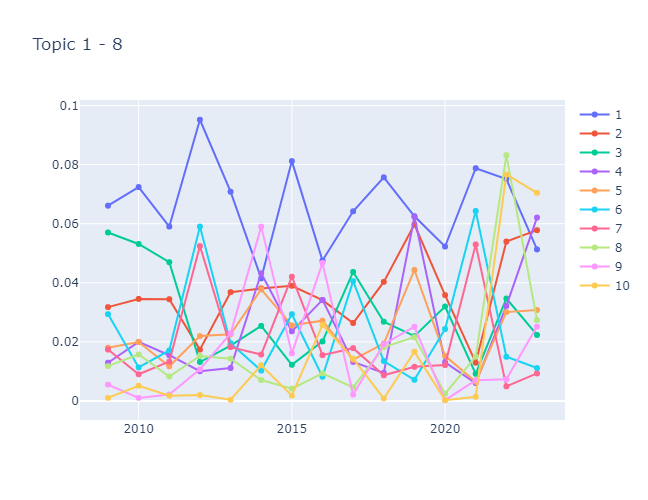

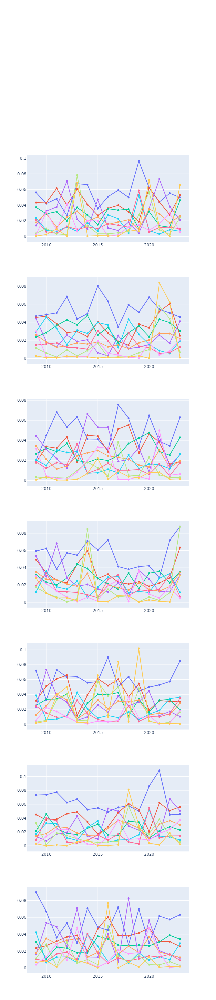

In [21]:
model_TSED.visualize_semantic(df_topic_semantic_prob_ft_w2v_topk, list_topic_ft_w2v, topic_results_ft_w2v)

## Visualize Coefisien Topic and Cluster Semantic 

In [24]:
coef_model_ft_w2v = model_TSED.evolving_dynamics(topic_results_ft_w2v)

In [25]:
coef_model_ft_w2v.rename(rename_columns(coef_model_ft_w2v, 1), axis=1, inplace=True)
coef_model_ft_w2v.index = np.arange(1, len(coef_model_ft_w2v) + 1)

In [26]:
coef_model_ft_w2v

,topic,1,2,3,4,5,6,7,8,9,10
1,1,-0.000479,0.001164,-0.001512,0.001635,0.000408,-0.000102,-0.000365,0.001934,0.000254,0.003375
2,2,0.000835,-0.000544,-0.000465,0.000167,0.000147,-0.000074,0.000423,0.000631,-0.000306,0.002040
3,3,0.000062,0.000055,0.000074,-0.000098,0.000423,-0.001583,-0.000411,0.001652,0.000103,0.002744
4,4,0.000449,-0.000010,0.000799,-0.000906,-0.000390,-0.000404,-0.000605,0.000288,-0.000056,0.000162
5,5,0.000076,-0.000395,0.000055,-0.001827,-0.000577,0.000011,-0.000188,0.001203,-0.000380,-0.000672
6,6,0.000136,-0.001233,-0.000351,-0.001380,-0.000266,0.000365,0.000021,-0.000350,-0.000078,-0.000289
7,7,-0.000559,0.000955,-0.000309,0.002093,0.000918,-0.000506,-0.000145,0.000501,0.000926,0.001189
8,8,-0.000543,0.000429,0.000953,-0.001142,-0.000749,-0.000452,-0.000230,-0.000871,-0.000143,-0.000353


In [27]:
coef_model_ft_w2v.to_excel('data/coefisien_model_ft_w2v.xlsx', index=False)

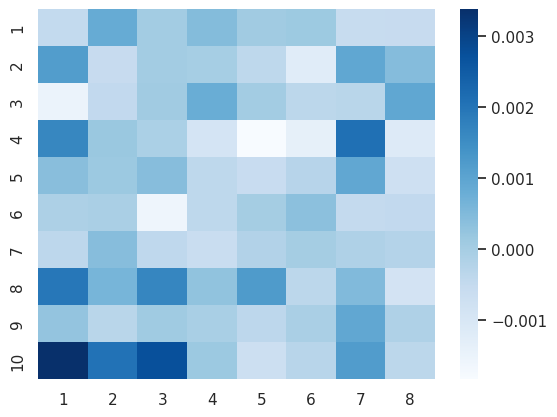

In [28]:
sns.heatmap(coef_model_ft_w2v.drop(columns='topic').T, annot=False, cmap='Blues');

In [29]:
x = np.array(coef_model_ft_w2v.columns.values[1:], dtype='float32')
y = np.array(coef_model_ft_w2v.topic.values, dtype='float32')
X, Y = np.meshgrid(x, y)
Z = coef_model_ft_w2v.iloc[:, 1:].values

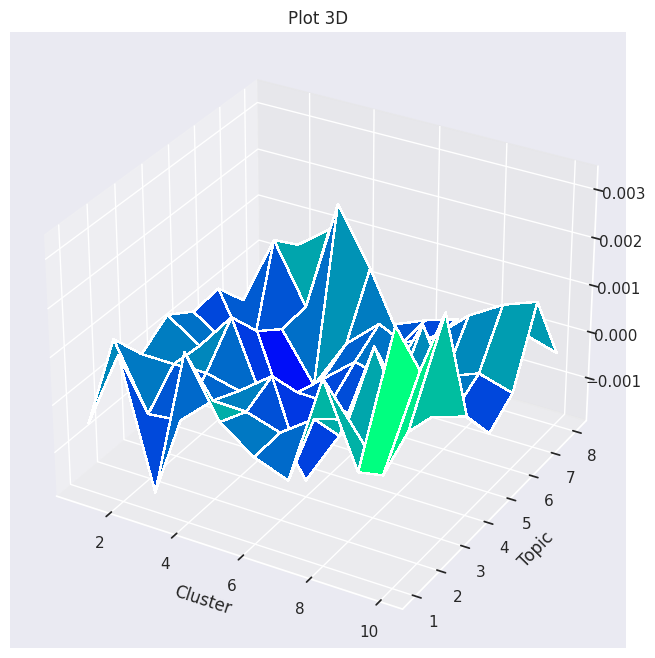

In [30]:
# membuat plot 3d
fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection='3d')
ax.set_title('Plot 3D')
ax.set_xlabel('Cluster')
ax.set_ylabel('Topic')
ax.plot_surface(X, Y, Z, antialiased=False, cmap='winter');

#### Interpretasi Hasil : <br>
Topic 1 in word cluster 10, which has the highest trend/upward trend. <br>
Topic 5 in word cluster 4, which has a decreasing trend. <br>

In [30]:
df_top_words

,1,2,3,4,5,6,7,8
0,student,student,student,soil,student,student,acid,student
1,low,power,power,life,algorithm,power,level,islamic
2,percentage,work,level,bank,performance,test,control,indonesia
3,score,government,number,financial,analysis,sample,test,risk
4,fiber,design,sample,local,control,correlation,effect,article
5,water,analysis,health,government,analysis,respondent,cholesterol,optimal
6,farmer,performance,respondent,company,land,factor,significant,model
7,member,character,sampling,social,specie,activity,variable,group
8,value,dna,control,society,forest,mass,body,cycle
9,food,reaction,significant,institution,character,test,increase,return


## Entropy

In [31]:
entropy_model_ft_w2v = model_TSED.get_entropy_topics(topic_results_ft_w2v)

In [32]:
entropy_model_ft_w2v.rename(rename_columns(entropy_model_ft_w2v, 1), axis=1, inplace=True)
entropy_model_ft_w2v.index = np.arange(1, len(entropy_model_ft_w2v) + 1)

In [33]:
entropy_model_ft_w2v

,year,1,2,3,4,5,6,7,8
1,2023,1.153229,0.999181,0.806412,0.780352,1.161014,0.917982,0.914450,0.676983
2,2022,1.213131,0.721632,1.024770,0.517926,0.850362,0.713426,1.035501,0.693857
3,2021,0.801853,0.856488,1.104798,0.945992,0.622535,0.620799,0.989100,0.755716
4,2020,0.666524,1.147970,0.762512,0.793847,0.679573,0.681482,0.883856,0.954109
5,2019,1.066907,0.922916,0.722986,0.683951,0.734423,1.095910,0.919239,0.806847
6,2018,0.796758,0.732975,0.693313,0.810480,0.578096,0.882945,1.152440,0.826254
7,2017,0.825877,0.705374,0.534801,0.858621,0.814734,1.134190,0.920553,0.783094
8,2016,0.936772,0.695312,0.705173,0.791493,0.857733,0.904373,0.718733,1.126448
9,2015,0.903721,0.698680,0.914321,0.951178,0.600201,1.107886,0.667673,0.738797
10,2014,0.976755,0.790806,0.737865,0.876951,1.168178,0.684373,0.714943,0.818789


In [34]:
entropy_model_ft_w2v.to_excel('data/entropy_model_ft_w2v.xlsx', index=False)

## Visualize Entropy Topic 

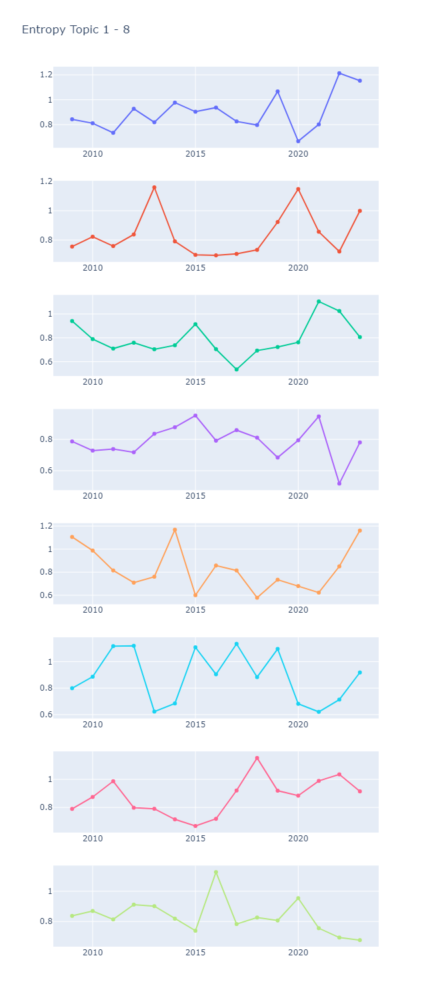

In [35]:
fig = make_subplots(rows=8, cols=1)
for i, j in enumerate(entropy_model_ft_w2v.columns[1:]):
    fig.add_trace(go.Scatter(x=entropy_model_ft_w2v['year'], y=entropy_model_ft_w2v[j], name=j), row=int(i)+1, col=1).update_layout(
            autosize=False, width=700, height=1500, showlegend=False, title='Entropy Topic 1 - 8'
        )
    
fig.show()

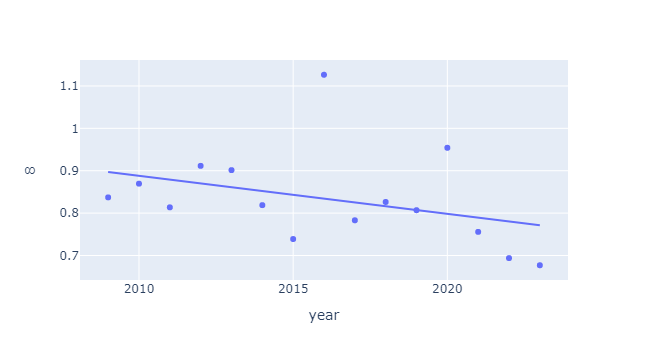

In [45]:
px.scatter(entropy_model_ft_w2v, x='year', y=8, trendline='ols')

#### Interpretation
Example interpretation and visualization, final interpretation in the paper. <br>
Topic 1 upward trend <br>
Topic 2 upward trend <br>
Topic 3 upward trend <br>
Topic 4 stagnant trend <br>
Topic 5 donwtrend <br>
Topic 6 donwtrend <br>
Topic 7 upward trend <br>
Topic 8 donwtrend <br>

In [46]:
naik = entropy_model_ft_w2v[['year', 1, 2, 3, 7]]
turun = entropy_model_ft_w2v[['year', 5, 6, 8]]
stagnan =  entropy_model_ft_w2v[['year', 4]]

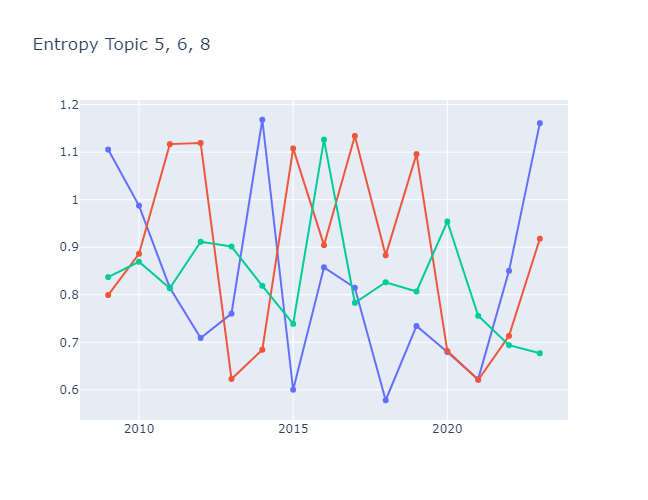

In [47]:
fig = make_subplots(rows=1, cols=1)
for i, j in enumerate(turun.columns[1:]):
    fig.add_trace(go.Scatter(x=entropy_model_ft_w2v['year'], y=entropy_model_ft_w2v[j], name=j), row=1, col=1).update_layout(
            autosize=False, width=500, height=500, showlegend=False, title='Entropy Topic 5, 6, 8'
        )
    
fig.show()

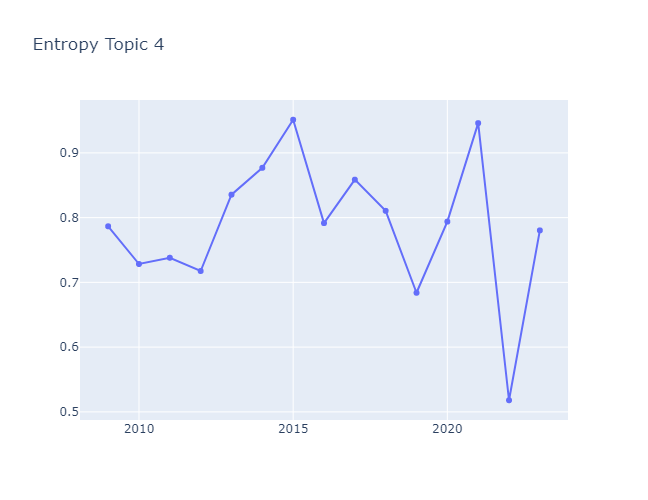

In [48]:
fig = make_subplots(rows=1, cols=1)
for i, j in enumerate(stagnan.columns[1:]):
    fig.add_trace(go.Scatter(x=entropy_model_ft_w2v['year'], y=entropy_model_ft_w2v[j], name=j), row=1, col=1).update_layout(
            autosize=False, width=500, height=500, showlegend=False, title='Entropy Topic 4'
        )
    
fig.show()

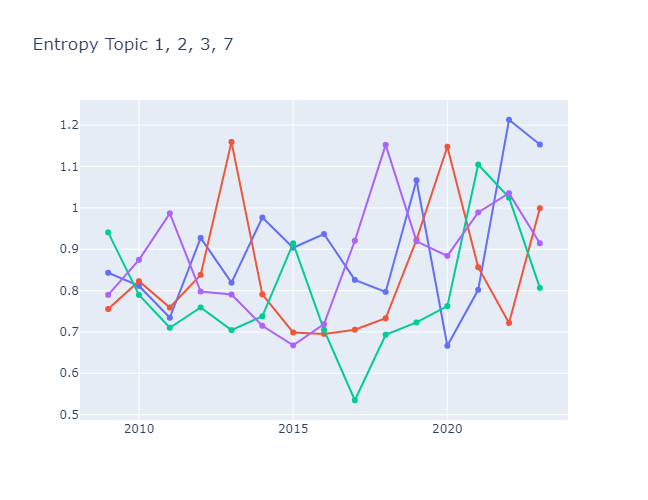

In [49]:
fig = make_subplots(rows=1, cols=1)
for i, j in enumerate(naik.columns[1:]):
    fig.add_trace(go.Scatter(x=entropy_model_ft_w2v['year'], y=entropy_model_ft_w2v[j], name=j), row=1, col=1).update_layout(
            autosize=False, width=500, height=500, showlegend=False, title='Entropy Topic 1, 2, 3, 7'
        )
    
fig.show()

## Visualize Intensity Topic 

/home/jovyan/ayuugm2023_gmail.com/my_env/disertasi/lib/python3.10/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




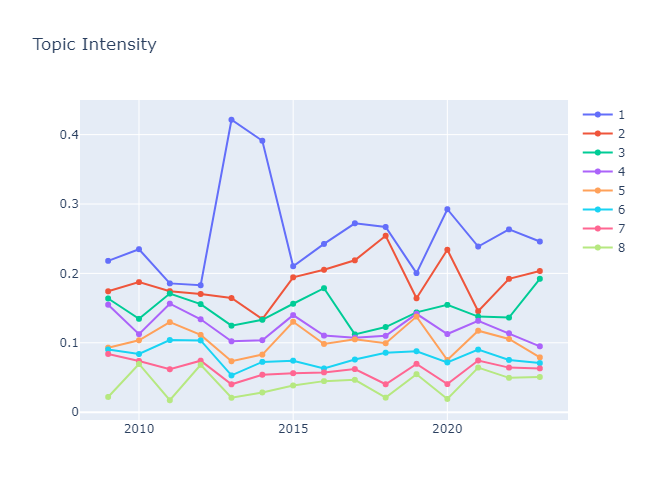

In [50]:
fig = make_subplots(rows=1, cols=1)
for h in df_intensity.columns[1:]:
    fig.add_trace(go.Line(x=df_intensity['year'], y=df_intensity[h], name=h), row=1, col=1).update_layout(
        autosize=False, width=650, height=500, showlegend=True, title='Topic Intensity'
    )
fig.show()